## We are again using the Adult Dataset

###### So we can use our results from Project 1 of how to preopare the Data, select the features, reduce Dimensionality in a maximal fassion and prepare everything

In [3]:
# Import Libs
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import graphviz
import copy
import numpy
import time
import sys

from sklearn import datasets, tree
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.cluster import KMeans
from sklearn.neighbors import LocalOutlierFactor
from os import system
from IPython.display import Image

%matplotlib inline
numpy.set_printoptions(threshold=sys.maxsize)

In [6]:
# Import the data and name the collums, clear NA
adultDf = pd.read_csv("adult.data",header=None, index_col=False, 
                      names=['age', 'workclass', 'fnlwgt', "education", "education_num", 
                             "martial-stat", "occupation", "relationship", "race", "sex", 
                             "cap-gains", "cap_loss", "hpw", "native_country", "50k"])
adultDf = adultDf.dropna()

### Now prepare Data:

In [7]:
# >50k -> 1, <=50k ->0
adultDf['50k'] = adultDf['50k'].replace(to_replace=' >50K', value=1)
adultDf['50k'] = adultDf['50k'].replace(to_replace=' <=50K', value=0)

# Copy so not to mess with the original dataframe
adultData = adultDf.copy()

# Remove fnlwgt(uncorelated) and education (doube data)
adultData.drop("fnlwgt", axis=1, inplace=True)
adultData.drop("education", axis=1, inplace=True)

# Add together Capital gains and losses
cap_gains = adultData["cap-gains"] - adultData["cap_loss"]
adultData["cap-gains"] = cap_gains
adultData.drop("cap_loss", axis=1, inplace=True)

# Repace Sex with 0,1:
adultData['sex'] = adultData['sex'].replace(to_replace=' Female', value=1)
adultData['sex'] = adultData['sex'].replace(to_replace=' Male', value=0)

# Repace all the complicated relationship status with -0,1 for single, married as that is the important bit:
adultData['relationship'] = adultData['relationship'].replace(to_replace=' Wife', value=1)
adultData['relationship'] = adultData['relationship'].replace(to_replace=' Husband', value=1)
adultData['relationship'] = adultData['relationship'].replace(to_replace=' Unmarried', value=0)
adultData['relationship'] = adultData['relationship'].replace(to_replace=' Other-relative', value=0)
adultData['relationship'] = adultData['relationship'].replace(to_replace=' Not-in-family', value=0)
adultData['relationship'] = adultData['relationship'].replace(to_replace=' Own-child', value=0)

# Remove martial-stat as this only doubes reationship status
adultData.drop("martial-stat", axis=1, inplace=True)

# Remove native Country as turning that into numerical data will either 
# add unwanted ordering (like using the GDP or development Index)
# Or give us the curse of dimensionaity if we add a "isfrom" variable for all countries
adultData.drop("native_country", axis=1, inplace=True)

# Add 3 binary collums for Workclass, isPrivate, isPublic, isSelfemployed, where a 0 on all means unempoyed or other
adultData.insert(2, "isPrivate", ([0]*adultData.shape[0]), True)
adultData.insert(2, "isPublic", ([0]*adultData.shape[0]), True)
adultData.insert(2, "isSelfemployed", ([0]*adultData.shape[0]), True)

# Now fill them, if we mask multiple times we need to add the earlier 0/1s:
adultData['isPrivate'] = numpy.where(adultData['workclass']== ' Private' , 1, 0)
adultData['isPublic'] = numpy.where(adultData["workclass"]== ' State-gov' , 1, 0)
adultData['isPublic'] = numpy.where(adultData['workclass']== ' Local-gov' , 1, 0)+adultData['isPublic']
adultData['isPublic'] = numpy.where(adultData['workclass']== ' Federal-gov', 1, 0)+adultData['isPublic']
adultData["isSelfemployed"] = numpy.where(adultData['workclass']== ' Self-emp-not-inc', 1, 0)
adultData["isSelfemployed"] = numpy.where(adultData['workclass']== ' Self-emp-inc', 1, 0)+adultData["isSelfemployed"]

# Now we can remove the Workclass
adultData.drop('workclass', axis=1, inplace=True)

# Add 3 binary collums for Race, isWhite, isBlack, isAsian, 
# Where a 0 on all means AmerIndianEskimo or Other as we only have limited Data on those
adultData.insert(8, "isWhite", ([0]*adultData.shape[0]), True)
adultData.insert(8, "isBlack", ([0]*adultData.shape[0]), True)
adultData.insert(8, "isAsian", ([0]*adultData.shape[0]), True)
adultData['isWhite'] = numpy.where(adultData['race']== ' White' , 1, 0)
adultData['isBlack'] = numpy.where(adultData["race"]== ' Black' , 1, 0)
adultData['isAsian'] = numpy.where(adultData['race']== ' Asian-Pac-Islander' , 1, 0)
adultData.drop('race', axis=1, inplace=True)

# Change Occupation into a Variable Field which is:
# -1 for low paying fields, 0 for normal fields and 1 for high paying fields
adultData.insert(5, "occField", ([0]*adultData.shape[0]), True)
# 2 High paying fields >40% over 50k
adultData["occField"] = numpy.where(adultData['occupation']== ' Exec-managerial' , 1, 0)+adultData["occField"]
adultData["occField"] = numpy.where(adultData['occupation']== ' Prof-specialty' , 1, 0)+adultData["occField"]
# 3 low paying fields, <10% over 50k
adultData["occField"] = numpy.where(adultData['occupation']== ' Handlers-cleaners' , -1, 0)+adultData["occField"]
adultData["occField"] = numpy.where(adultData['occupation']== ' Other-service' , -1, 0)+adultData["occField"]
adultData["occField"] = numpy.where(adultData['occupation']== ' Priv-house-serv' , -1, 0)+adultData["occField"]
adultData.drop('occupation', axis=1, inplace=True)

adultData = adultData[adultData["cap-gains"] != 99999].copy()
adultDatalabels = adultData["50k"]
# STANDARTIZE NOW: <--- Misstake, not snormalized Now, but standardized numerical variables at 30x binary


adultData['education_num'] = adultData['education_num'].apply(lambda x: x/13*30)
column = adultData["age"]
max_age = column.max()
adultData['age'] = adultData['age'].apply(lambda x: x/max_age*30)
column = adultData["cap-gains"]
max_capgains = column.max()
adultData['cap-gains'] = adultData['cap-gains'].apply(lambda x: x/max_capgains*30)
column = adultData["hpw"]
max_hpw = column.max()
adultData['hpw'] = adultData['hpw'].apply(lambda x: x/max_hpw*30)
# Lets look at the Table Now
adultDatalabels = adultData["50k"]
adultData.drop('50k', axis=1, inplace=True)
print(adultData)
print(adultDatalabels)

             age  isSelfemployed  isPublic  isPrivate  education_num  \
0      13.000000               0         1          0      30.000000   
1      16.666667               1         0          0      30.000000   
2      12.666667               0         0          1      20.769231   
3      17.666667               0         0          1      16.153846   
4       9.333333               0         0          1      30.000000   
...          ...             ...       ...        ...            ...   
32556   9.000000               0         0          1      27.692308   
32557  13.333333               0         0          1      20.769231   
32558  19.333333               0         0          1      20.769231   
32559   7.333333               0         0          1      20.769231   
32560  17.333333               1         0          0      20.769231   

       occField  relationship  isAsian  isBlack  isWhite  sex  cap-gains  \
0             0             0        0        0        1   

In [8]:
adultData

,age,isSelfemployed,isPublic,isPrivate,education_num,occField,relationship,isAsian,isBlack,isWhite,sex,cap-gains,hpw
0,13.000000,0,1,0,30.000000,0,0,0,0,1,0,1.578794,12.121212
1,16.666667,1,0,0,30.000000,1,1,0,0,1,0,0.000000,3.939394
2,12.666667,0,0,1,20.769231,-1,0,0,0,1,0,0.000000,12.121212
3,17.666667,0,0,1,16.153846,-1,1,0,1,0,0,0.000000,12.121212
4,9.333333,0,0,1,30.000000,1,1,0,1,0,1,0.000000,12.121212
...,...,...,...,...,...,...,...,...,...,...,...,...,...
32556,9.000000,0,0,1,27.692308,0,1,0,0,1,1,0.000000,11.515152
32557,13.333333,0,0,1,20.769231,0,1,0,0,1,0,0.000000,12.121212
32558,19.333333,0,0,1,20.769231,0,0,0,0,1,1,0.000000,12.121212
32559,7.333333,0,0,1,20.769231,0,0,0,0,1,0,0.000000,6.060606


## Now we can run the DBSCAN Algorithm
##### For a fast and simple way to get Metrics for our resulting clusterings we followed the Example from the scikit-learn website:
https://scikit-learn.org/stable/auto_examples/cluster/plot_dbscan.html#sphx-glr-auto-examples-cluster-plot-dbscan-py

#### We will first run the clustering with some Parameters, and then run the same Evaluation Code to learn how it went

In [9]:
# epsilon = 1 and min_samples = 10
clustering_1_10_e = DBSCAN(eps=1, min_samples=10, metric='euclidean').fit(adultData)

In [10]:
# Get Metrics of the resulting Clustering
#core_samples_mask = numpy.zeros_like(clustering_1_10_e.labels_, dtype=bool)
#core_samples_mask[clustering_1_10_e.core_sample_indices_] = True
labels = clustering_1_10_e.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)
print("Homogeneity: %0.3f" % metrics.homogeneity_score(adultDatalabels, labels))
# I have no idea why the Labels 0 and 1 are in places 1 and 2. Wierd, i think because 0 is cluster -1 aka outliers
print("Confusion Matrix")
print( metrics.confusion_matrix(adultDatalabels, labels)[1] ) 
print( metrics.confusion_matrix(adultDatalabels, labels)[2] ) 
print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(adultData, labels))
print("Overview over the Cluster")
silluets = metrics.silhouette_samples(adultData, labels, metric='euclidean' )
i = 0
for l in set(labels):
    print(" ")
    num = list(labels).count(l)
    print("Cluster " + str(l) + " has Size: " + str( num ) )
    print("Silluete is: " + str( silluets[i] ))
    i = i+1

Estimated number of clusters: 77
Estimated number of noise points: 15029
Homogeneity: 0.065
Confusion Matrix
[10557  5964  1557  3928     4     5    10   365   206   242    75    31
    81    65   147    40   230   267    24    35    31   125    93    47
    71     7    21    16     3    16    13    10     7    15     8    16
    10     6     7    29    21     9    52     3    12     5     9     4
    20     9     7    15     5     3     6    22    12     5    11     1
     0     5     5     4     4    10     8    10    10    10     7     3
     8     7     3     5     5     1]
[4472  911  940  662   13    5    0   92   36    0    1   22   70   20
    8    0   18   11    0    0    0   32  194    0    0    5   15    0
    3    0    3   12    3   18    6   12    0    6    0    2    2    0
    2    7    2    3    6    7    0    0    3    0    7    2    4    2
    2    6    1    9    7    1    5    0    0    0    0    2    0    0
    0    0    0    0    5    0    0    5]
Silhouette Coeffic

### Thats Bad, lots of clusters, bad siluette, no homoginity

In [11]:
# epsilon = 1 and min_samples = 10
clustering_05_5_e = DBSCAN(eps=0.5, min_samples=5, metric='euclidean').fit(adultData)

In [12]:
# Get Metrics of the resulting Clustering
#core_samples_mask = numpy.zeros_like(clustering_1_10_e.labels_, dtype=bool)
#core_samples_mask[clustering_1_10_e.core_sample_indices_] = True
labels = clustering_05_5_e.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)
print("Homogeneity: %0.3f" % metrics.homogeneity_score(adultDatalabels, labels))
# I have no idea why the Labels 0 and 1 are in places 1 and 2. Wierd, i think because 0 is cluster -1 aka outliers
print("Confusion Matrix")
print( metrics.confusion_matrix(adultDatalabels, labels)[1] ) 
print( metrics.confusion_matrix(adultDatalabels, labels)[2] ) 
print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(adultData, labels))
print("Overview over the Cluster")
silluets = metrics.silhouette_samples(adultData, labels, metric='euclidean' )
i = 0
for l in set(labels):
    print(" ")
    num = list(labels).count(l)
    print("Cluster " + str(l) + " has Size: " + str( num ) )
    print("Silluete is: " + str( silluets[i] ))
    i = i+1

Estimated number of clusters: 588
Estimated number of noise points: 19547
Homogeneity: 0.151
Confusion Matrix
[14304   221     6   674   567  1028    14   288     1    34    15   284
   376    59    20    14    14   114     5    11    92   140     9    39
     6    10     6    12     5    18    28    23    18    17    10   127
    11    16    14    62    10    52    11    17    19    22    10     1
    22    32     8    67    10     3    43    13     9   144     6    12
    17    12    12     9    50    10     0    62    17    18    14     9
    64    15    74     7     5    24     7     5    50     2     6    66
     9    19    53    35     5    98    17    46    24    11    10    13
     8    13   120    17    21    56     6    45    11    49    15     1
     4     5    47    36     8    11    36     9     4    16     5    11
    77    16    11    12    37    33    84     8     3    69    20    12
    14     5    16     4    23    15     5     5    14    30    18    29
    15    31  

Cluster 53 has Size: 43
Silluete is: -0.8411163401430487
 
Cluster 54 has Size: 14
Silluete is: -0.868715859074993
 
Cluster 55 has Size: 9
Silluete is: -0.6311120521770496
 
Cluster 56 has Size: 150
Silluete is: 0.8682428589842385
 
Cluster 57 has Size: 8
Silluete is: -0.8086415785279707
 
Cluster 58 has Size: 12
Silluete is: -0.677842033384462
 
Cluster 59 has Size: 18
Silluete is: 0.9004745370238498
 
Cluster 60 has Size: 12
Silluete is: -0.8185401926648456
 
Cluster 61 has Size: 13
Silluete is: -0.8956004709887598
 
Cluster 62 has Size: 15
Silluete is: -0.6984964807396077
 
Cluster 63 has Size: 52
Silluete is: -0.7876598798444433
 
Cluster 64 has Size: 11
Silluete is: -0.8380506842798954
 
Cluster 65 has Size: 6
Silluete is: -0.6775078073533146
 
Cluster 66 has Size: 67
Silluete is: -0.6249156537776164
 
Cluster 67 has Size: 18
Silluete is: -0.04179106860672985
 
Cluster 68 has Size: 66
Silluete is: -0.8976081981962238
 
Cluster 69 has Size: 14
Silluete is: -0.05162780539117342
 
C

Cluster 226 has Size: 7
Silluete is: -0.46160519320791527
 
Cluster 227 has Size: 6
Silluete is: -0.7959484214082023
 
Cluster 228 has Size: 6
Silluete is: -0.5304831481304542
 
Cluster 229 has Size: 9
Silluete is: -0.8646318920492735
 
Cluster 230 has Size: 59
Silluete is: -0.7333202786400534
 
Cluster 231 has Size: 17
Silluete is: -0.8405243903258367
 
Cluster 232 has Size: 8
Silluete is: 0.15371112174698093
 
Cluster 233 has Size: 6
Silluete is: -0.8202687642164249
 
Cluster 234 has Size: 5
Silluete is: -0.773028608568582
 
Cluster 235 has Size: 5
Silluete is: 0.6017130068688256
 
Cluster 236 has Size: 24
Silluete is: -0.8570175948910997
 
Cluster 237 has Size: 5
Silluete is: -0.381937652297101
 
Cluster 238 has Size: 7
Silluete is: -0.7759871556546204
 
Cluster 239 has Size: 26
Silluete is: -0.6349489711503378
 
Cluster 240 has Size: 9
Silluete is: -0.2967968613904084
 
Cluster 241 has Size: 6
Silluete is: -0.6592471566610832
 
Cluster 242 has Size: 5
Silluete is: -0.74696522245409

Cluster 414 has Size: 9
Silluete is: -0.6381298082293249
 
Cluster 415 has Size: 9
Silluete is: -0.7749393907455284
 
Cluster 416 has Size: 9
Silluete is: -0.8428861010882592
 
Cluster 417 has Size: 5
Silluete is: -0.6943270173796012
 
Cluster 418 has Size: 7
Silluete is: -0.8133487069789405
 
Cluster 419 has Size: 8
Silluete is: 0.2771114132431673
 
Cluster 420 has Size: 8
Silluete is: -0.8981093262448476
 
Cluster 421 has Size: 6
Silluete is: -0.88883560970745
 
Cluster 422 has Size: 10
Silluete is: -0.8938157354308381
 
Cluster 423 has Size: 8
Silluete is: -0.6197863002412852
 
Cluster 424 has Size: 12
Silluete is: -0.8585592700189977
 
Cluster 425 has Size: 5
Silluete is: -0.512889248698593
 
Cluster 426 has Size: 13
Silluete is: -0.8440541847412293
 
Cluster 427 has Size: 7
Silluete is: -0.8772077199351261
 
Cluster 428 has Size: 14
Silluete is: 0.8298917487969496
 
Cluster 429 has Size: 5
Silluete is: -0.26184225693320945
 
Cluster 430 has Size: 6
Silluete is: -0.5601025627407856

Cluster 568 has Size: 4
Silluete is: -0.8485513678206629
 
Cluster 569 has Size: 5
Silluete is: -0.9031946819422798
 
Cluster 570 has Size: 5
Silluete is: -0.6242358323900091
 
Cluster 571 has Size: 5
Silluete is: 0.31142313097375135
 
Cluster 572 has Size: 6
Silluete is: -0.936784829247224
 
Cluster 573 has Size: 1
Silluete is: -0.7760377278832272
 
Cluster 574 has Size: 5
Silluete is: -0.6397385464305162
 
Cluster 575 has Size: 5
Silluete is: -0.7044606924338866
 
Cluster 576 has Size: 5
Silluete is: -0.8902640193957806
 
Cluster 577 has Size: 6
Silluete is: -0.7773479008378389
 
Cluster 578 has Size: 5
Silluete is: -0.9233824569893953
 
Cluster 579 has Size: 5
Silluete is: -0.8006356381507672
 
Cluster 580 has Size: 4
Silluete is: -0.7539642864930016
 
Cluster 581 has Size: 5
Silluete is: -0.8162512231035982
 
Cluster 582 has Size: 4
Silluete is: -0.8343978591697114
 
Cluster 583 has Size: 6
Silluete is: -0.7402711744376668
 
Cluster 584 has Size: 6
Silluete is: -0.8382546480773237


### Worse Silluete, better but still bad Homogenity, Way way to many Clusters


In [13]:
# epsilon = 1 and min_samples = 10
clustering_05_25_e = DBSCAN(eps=0.5, min_samples=25, metric='euclidean').fit(adultData)

In [11]:
# Get Metrics of the resulting Clustering
#core_samples_mask = numpy.zeros_like(clustering_1_10_e.labels_, dtype=bool)
#core_samples_mask[clustering_1_10_e.core_sample_indices_] = True
labels = clustering_05_25_e.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)
print("Homogeneity: %0.3f" % metrics.homogeneity_score(adultDatalabels, labels))
# I have no idea why the Labels 0 and 1 are in places 1 and 2. Wierd, i think because 0 is cluster -1 aka outliers
print("Confusion Matrix")
print( metrics.confusion_matrix(adultDatalabels, labels)[1] ) 
print( metrics.confusion_matrix(adultDatalabels, labels)[2] ) 
print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(adultData, labels))
print("Overview over the Cluster")
silluets = metrics.silhouette_samples(adultData, labels, metric='euclidean' )
i = 0
for l in set(labels):
    print(" ")
    num = list(labels).count(l)
    print("Cluster " + str(l) + " has Size: " + str( num ) )
    print("Silluete is: " + str( silluets[i] ))
    i = i+1

Estimated number of clusters: 37
Estimated number of noise points: 28208
Homogeneity: 0.041
Confusion Matrix
[21008   610   763   175   504   239   295   149    85    26    16    76
    16    28    53    27    78    30    34    30    18    34    34    35
    34    16    14    20    44    24    51    53    20    15    26    17
    16     7]
[7200    5  276    1    2  101    1    0    3    1   65    2   32    0
    0   39    1    0    0    0   17   14   13    1    2   19   12    9
    0    1    1    0   11    2    0    0    9    1]
Silhouette Coefficient: -0.563
Overview over the Cluster
 
Cluster 0 has Size: 615
Silluete is: -0.8130391736791582
 
Cluster 1 has Size: 1039
Silluete is: -0.36875083694352817
 
Cluster 2 has Size: 176
Silluete is: -0.7439560513925305
 
Cluster 3 has Size: 506
Silluete is: -0.5594592857368974
 
Cluster 4 has Size: 340
Silluete is: -0.8098981869823688
 
Cluster 5 has Size: 296
Silluete is: -0.7532507934543683
 
Cluster 6 has Size: 149
Silluete is: -0.264642973

### Way less clusters, but now everything is noise, also not good

In [14]:
# epsilon = 1 and min_samples = 10
clustering_075_10_e = DBSCAN(eps=0.75, min_samples=10, metric='euclidean').fit(adultData)

In [15]:
# Get Metrics of the resulting Clustering
#core_samples_mask = numpy.zeros_like(clustering_1_10_e.labels_, dtype=bool)
#core_samples_mask[clustering_1_10_e.core_sample_indices_] = True
labels = clustering_075_10_e.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)
print("Homogeneity: %0.3f" % metrics.homogeneity_score(adultDatalabels, labels))
# I have no idea why the Labels 0 and 1 are in places 1 and 2. Wierd
print("Confusion Matrix")
print( metrics.confusion_matrix(adultDatalabels, labels)[1] ) 
print( metrics.confusion_matrix(adultDatalabels, labels)[2] ) 
print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(adultData, labels))
print("Overview over the Cluster")
silluets = metrics.silhouette_samples(adultData, labels, metric='euclidean' )
i = 0
for l in set(labels):
    print(" ")
    num = list(labels).count(l)
    print("Cluster " + str(l) + " has Size: " + str( num ) )
    print("Silluete is: " + str( silluets[i] ))
    i = i+1

Estimated number of clusters: 202
Estimated number of noise points: 20463
Homogeneity: 0.128
Confusion Matrix
[14945   259   911   776  1078    19   480   408    27   429    60    31
    20    26   126    53   111   143    56     6    16     6    19    45
     5    46    33    23   235    11    32    22    66    18    55    62
    17    18   112    26    82    13   164    18    57    10    56    81
   102    22    16    10    17    88   221    63    11    36    37   116
    19    57    15    10    14   136    17     7    37    57    12    17
    36    19    54    12    11    88    59    67   100    24    39    16
    15    37    26    30    13    64    13     4    20    40    22    21
    12    22    12    31    21    13     2    35    14     6     2    57
    12    50    12     5    17     2    21    10    11    12    26    10
    18    14     7    45    27    26    13    12     8    18     1    18
    20    17    26    11    19    14    10     8    13    28    16    21
    19    17  

Cluster 126 has Size: 13
Silluete is: -0.8485737282307356
 
Cluster 127 has Size: 10
Silluete is: -0.113327384936195
 
Cluster 128 has Size: 18
Silluete is: -0.8185376280516192
 
Cluster 129 has Size: 28
Silluete is: -0.6615363207361882
 
Cluster 130 has Size: 19
Silluete is: -0.718828801427188
 
Cluster 131 has Size: 20
Silluete is: -0.7958672367389774
 
Cluster 132 has Size: 17
Silluete is: -0.6284549143846132
 
Cluster 133 has Size: 26
Silluete is: 0.32462678980545734
 
Cluster 134 has Size: 11
Silluete is: -0.812070115881099
 
Cluster 135 has Size: 24
Silluete is: 0.2230466218274515
 
Cluster 136 has Size: 15
Silluete is: 0.5791404358386462
 
Cluster 137 has Size: 11
Silluete is: -0.7305812959345316
 
Cluster 138 has Size: 10
Silluete is: -0.02492793571746809
 
Cluster 139 has Size: 13
Silluete is: -0.7727380573342005
 
Cluster 140 has Size: 28
Silluete is: 0.5666996718554631
 
Cluster 141 has Size: 16
Silluete is: -0.5978970962290522
 
Cluster 142 has Size: 25
Silluete is: 0.14681

# Same Homogenity, just barely less clusters. Normalizing the Data was a Misstake, i now changed that, but its still bad.

In [16]:
# epsilon = 1 and min_samples = 10
clustering_2_10_e = DBSCAN(eps=2, min_samples=10, metric='euclidean').fit(adultData)

In [17]:
# Get Metrics of the resulting Clustering
#core_samples_mask = numpy.zeros_like(clustering_1_10_e.labels_, dtype=bool)
#core_samples_mask[clustering_1_10_e.core_sample_indices_] = True
labels = clustering_2_10_e.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)
print("Homogeneity: %0.3f" % metrics.homogeneity_score(adultDatalabels, labels))
# I have no idea why the Labels 0 and 1 are in places 1 and 2. Wierd
print("Confusion Matrix")
print( metrics.confusion_matrix(adultDatalabels, labels)[1] ) 
print( metrics.confusion_matrix(adultDatalabels, labels)[2] ) 
print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(adultData, labels))
print("Overview over the Cluster")
silluets = metrics.silhouette_samples(adultData, labels, metric='euclidean' )
i = 0
for l in set(labels):
    print(" ")
    num = list(labels).count(l)
    print("Cluster " + str(l) + " has Size: " + str( num ) )
    print("Silluete is: " + str( silluets[i] ))
    i = i+1

Estimated number of clusters: 35
Estimated number of noise points: 2870
Homogeneity: 0.118
Confusion Matrix
[1715 2954 8651  954  601  696  886  402   63  380 5754  225   88  723
   96  346    0    6   14   14   32   11    9    0   14   25    8   11
    1    9    2   12    0    0    9    9]
[1155 1858 1514   32  682  190  275   19  179   17 1226    7  233   43
    3   18  115    3    0    8    7    1    2   24    7    2    0    0
    9    2   19    5   11   14    1    1]
Silhouette Coefficient: -0.096
Overview over the Cluster
 
Cluster 0 has Size: 4812
Silluete is: -0.030715784805003126
 
Cluster 1 has Size: 10165
Silluete is: -0.7299146567813698
 
Cluster 2 has Size: 986
Silluete is: 0.1604742014532854
 
Cluster 3 has Size: 1283
Silluete is: -0.16567535948848539
 
Cluster 4 has Size: 886
Silluete is: 0.010535683676100653
 
Cluster 5 has Size: 1161
Silluete is: 0.15040222155328184
 
Cluster 6 has Size: 421
Silluete is: -0.6280475092802776
 
Cluster 7 has Size: 242
Silluete is: 0.13108

### Less Clusters, silluette is better but still bad, homginity is worse, a vew clusters dominate everything

In [18]:
# epsilon = 2.5 and min_samples = 15
clustering_25_15_e = DBSCAN(eps=1.4142135623730951, min_samples=15, metric='euclidean').fit(adultData)

In [19]:
# Get Metrics of the resulting Clustering
#core_samples_mask = numpy.zeros_like(clustering_1_10_e.labels_, dtype=bool)
#core_samples_mask[clustering_1_10_e.core_sample_indices_] = True
labels = clustering_25_15_e.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)
print("Homogeneity: %0.3f" % metrics.homogeneity_score(adultDatalabels, labels))
# I have no idea why the Labels 0 and 1 are in places 1 and 2. Wierd
print("Confusion Matrix")
print( metrics.confusion_matrix(adultDatalabels, labels)[1] ) 
print( metrics.confusion_matrix(adultDatalabels, labels)[2] ) 
print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(adultData, labels))
print("Overview over the Cluster")
silluets = metrics.silhouette_samples(adultData, labels, metric='euclidean' )
i = 0
for l in set(labels):
    print(" ")
    num = list(labels).count(l)
    print("Cluster " + str(l) + " has Size: " + str( num ) )
    print("Silluete is: " + str( silluets[i] ))
    i = i+1

Estimated number of clusters: 27
Estimated number of noise points: 9667
Homogeneity: 0.084
Confusion Matrix
[6377 7474  385 2293 4952  405  200  616  152  384  328  253  365   84
  139   72    4  107    0   20   63   11   13    4    0    1    3   15]
[3290 1196  435 1401  916   16    8  174    5   95    0   13   25    0
    0    0   14    6   18    2    1   15    1    9   16   14   12    0]
Silhouette Coefficient: -0.297
Overview over the Cluster
 
Cluster 0 has Size: 8670
Silluete is: -0.6336570948108036
 
Cluster 1 has Size: 820
Silluete is: -0.3937315436549843
 
Cluster 2 has Size: 3694
Silluete is: 0.07129237012826553
 
Cluster 3 has Size: 5868
Silluete is: -0.5681571765872152
 
Cluster 4 has Size: 421
Silluete is: -0.04826959028740814
 
Cluster 5 has Size: 208
Silluete is: 0.15653917949221208
 
Cluster 6 has Size: 790
Silluete is: -0.4766106919639891
 
Cluster 7 has Size: 157
Silluete is: -0.6756226208606501
 
Cluster 8 has Size: 479
Silluete is: -0.5930979565735476
 
Cluster 9 ha

### Homoginty became way worse, silluete finaly in a reasonable area, but still low, on cluster completly dominates

# Result: DBSCAN can not deal with the Adult dataset, no matter wether we have larger or smaller epsilons, wether we enforce more or less min-samples, etc. We even tried rescaling the numerical variables with the binary ones to give it better chances, but the binary ones are apperantly destroying everything

# Lets try K-Means for Fucks sake, maybe that one works

In [20]:
kmeans2 = KMeans(n_clusters=2, random_state=0).fit(adultData)

In [21]:
# Get Metrics of the resulting Clustering
#core_samples_mask = numpy.zeros_like(clustering_1_10_e.labels_, dtype=bool)
#core_samples_mask[clustering_1_10_e.core_sample_indices_] = True
labels = kmeans2.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
#n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
# print("Estimated number of noise points: %d" % n_noise_)
print("Homogeneity: %0.3f" % metrics.homogeneity_score(adultDatalabels, labels))
# Here we can use lines 0 and 1 of the confusion matrix, so i suspect its the outliers which are line 0 in DBSCAN
print("Confusion Matrix")
print( metrics.confusion_matrix(adultDatalabels, labels)[0] ) 
print( metrics.confusion_matrix(adultDatalabels, labels)[1] ) 
print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(adultData, labels))
print("Overview over the Cluster")
silluets = metrics.silhouette_samples(adultData, labels, metric='euclidean' )
i = 0
for l in set(labels):
    print(" ")
    num = list(labels).count(l)
    print("Cluster " + str(l) + " has Size: " + str( num ) )
    print("Silluete is: " + str( silluets[i] ))
    i = i+1

Estimated number of clusters: 2
Homogeneity: 0.088
Confusion Matrix
[19235  5485]
[3324 4358]
Silhouette Coefficient: 0.317
Overview over the Cluster
 
Cluster 0 has Size: 22559
Silluete is: 0.4684339299818368
 
Cluster 1 has Size: 9843
Silluete is: 0.23183529922885748


### far Far better Silluete, but Homogenity is still bad. 

In [24]:
kmeans3 = KMeans(n_clusters=3, random_state=0).fit(adultData)

In [25]:
# Get Metrics of the resulting Clustering
#core_samples_mask = numpy.zeros_like(clustering_1_10_e.labels_, dtype=bool)
#core_samples_mask[clustering_1_10_e.core_sample_indices_] = True
labels = kmeans3.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
#n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
# print("Estimated number of noise points: %d" % n_noise_)
print("Homogeneity: %0.3f" % metrics.homogeneity_score(adultDatalabels, labels))
print("Confusion Matrix")
print( metrics.confusion_matrix(adultDatalabels, labels)[0] ) 
print( metrics.confusion_matrix(adultDatalabels, labels)[1] ) 
print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(adultData, labels))
print("Overview over the Cluster")
silluets = metrics.silhouette_samples(adultData, labels, metric='euclidean' )
i = 0
for l in set(labels):
    print(" ")
    num = list(labels).count(l)
    print("Cluster " + str(l) + " has Size: " + str( num ) )
    print("Silluete is: " + str( silluets[i] ))
    i = i+1

Estimated number of clusters: 3
Homogeneity: 0.113
Confusion Matrix
[12608  5224  6888]
[1285 4256 2141]
Silhouette Coefficient: 0.306
Overview over the Cluster
 
Cluster 0 has Size: 13893
Silluete is: 0.44552841601508425
 
Cluster 1 has Size: 9480
Silluete is: 0.22588382522645314
 
Cluster 2 has Size: 9029
Silluete is: 0.2399383268846378


### We lost a bit of silluetee coeficcient, but our homogenity is growing, lets try 4 and 6

In [406]:
kmeans4 = KMeans(n_clusters=4, random_state=0).fit(adultData)

In [23]:
# Get Metrics of the resulting Clustering
#core_samples_mask = numpy.zeros_like(clustering_1_10_e.labels_, dtype=bool)
#core_samples_mask[clustering_1_10_e.core_sample_indices_] = True
labels = kmeans4.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
#n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
# print("Estimated number of noise points: %d" % n_noise_)
print("Homogeneity: %0.3f" % metrics.homogeneity_score(adultDatalabels, labels))
print("Confusion Matrix")
print( metrics.confusion_matrix(adultDatalabels, labels)[0] ) 
print( metrics.confusion_matrix(adultDatalabels, labels)[1] ) 
print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(adultData, labels))
print("Overview over the Cluster")
silluets = metrics.silhouette_samples(adultData, labels, metric='euclidean' )
i = 0
for l in set(labels):
    print(" ")
    num = list(labels).count(l)
    print("Cluster " + str(l) + " has Size: " + str( num ) )
    print("Silluete is: " + str( silluets[i] ))
    i = i+1

Estimated number of clusters: 4
Homogeneity: 0.131
Confusion Matrix
[11411  6122  2420  4767]
[1119 2379  171 4172]
Silhouette Coefficient: 0.316
Overview over the Cluster
 
Cluster 0 has Size: 12530
Silluete is: 0.43411018844041055
 
Cluster 1 has Size: 8501
Silluete is: 0.11084094861645057
 
Cluster 2 has Size: 2591
Silluete is: 0.13240759100415203
 
Cluster 3 has Size: 8939
Silluete is: 0.13154968139300763


In [24]:
kmeans6 = KMeans(n_clusters=6, random_state=0).fit(adultData)

In [25]:
# Get Metrics of the resulting Clustering
#core_samples_mask = numpy.zeros_like(clustering_1_10_e.labels_, dtype=bool)
#core_samples_mask[clustering_1_10_e.core_sample_indices_] = True
labels = kmeans6.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
#n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
# print("Estimated number of noise points: %d" % n_noise_)
print("Homogeneity: %0.3f" % metrics.homogeneity_score(adultDatalabels, labels))
print("Confusion Matrix")
print( metrics.confusion_matrix(adultDatalabels, labels)[0] ) 
print( metrics.confusion_matrix(adultDatalabels, labels)[1] ) 
print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(adultData, labels))
print("Overview over the Cluster")
silluets = metrics.silhouette_samples(adultData, labels, metric='euclidean' )
i = 0
for l in set(labels):
    print(" ")
    num = list(labels).count(l)
    print("Cluster " + str(l) + " has Size: " + str( num ) )
    print("Silluete is: " + str( silluets[i] ))
    i = i+1

Estimated number of clusters: 6
Homogeneity: 0.141
Confusion Matrix
[9674 4545 4852 3276 2373    0]
[1667 3980 1810   60  165  159]
Silhouette Coefficient: 0.309
Overview over the Cluster
 
Cluster 0 has Size: 11341
Silluete is: 0.44055892647877326
 
Cluster 1 has Size: 8525
Silluete is: 0.09363437165420449
 
Cluster 2 has Size: 6662
Silluete is: 0.3323392885288826
 
Cluster 3 has Size: 3336
Silluete is: 0.1437338614743775
 
Cluster 4 has Size: 2538
Silluete is: 0.3152142994231749
 
Cluster 5 has Size: 159
Silluete is: 0.5152721004169174


### Homoginity is growing to 14%, silluette did not get significantly worse, lets try 12 for good measure

In [26]:
kmeans12 = KMeans(n_clusters=12, random_state=0).fit(adultData)

In [27]:
# Get Metrics of the resulting Clustering
#core_samples_mask = numpy.zeros_like(clustering_1_10_e.labels_, dtype=bool)
#core_samples_mask[clustering_1_10_e.core_sample_indices_] = True
labels = kmeans12.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
#n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
# print("Estimated number of noise points: %d" % n_noise_)
print("Homogeneity: %0.3f" % metrics.homogeneity_score(adultDatalabels, labels))
print("Confusion Matrix")
print( metrics.confusion_matrix(adultDatalabels, labels)[0] ) 
print( metrics.confusion_matrix(adultDatalabels, labels)[1] ) 
print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(adultData, labels))
print("Overview over the Cluster")
silluets = metrics.silhouette_samples(adultData, labels, metric='euclidean' )
i = 0
for l in set(labels):
    print(" ")
    num = list(labels).count(l)
    print("Cluster " + str(l) + " has Size: " + str( num ) )
    print("Silluete is: " + str( silluets[i] ))
    i = i+1

Estimated number of clusters: 12
Homogeneity: 0.185
Confusion Matrix
[5735 4450 1265 2821 1681  841    0 1176 2465 2467  684 1135]
[ 431 1378 1737 1107   61  111  159  102   35 1066 1175  479]
Silhouette Coefficient: 0.277
Overview over the Cluster
 
Cluster 0 has Size: 6166
Silluete is: 0.2554578737785732
 
Cluster 1 has Size: 5828
Silluete is: 0.09188589992543775
 
Cluster 2 has Size: 3002
Silluete is: 0.3225301137284367
 
Cluster 3 has Size: 3928
Silluete is: 0.16764996887184178
 
Cluster 4 has Size: 1742
Silluete is: 0.5310883975981647
 
Cluster 5 has Size: 952
Silluete is: 0.28537889756613133
 
Cluster 6 has Size: 159
Silluete is: 0.1664798338391073
 
Cluster 7 has Size: 1278
Silluete is: 0.23994918986092315
 
Cluster 8 has Size: 2500
Silluete is: -0.06770998632580323
 
Cluster 9 has Size: 3533
Silluete is: -0.037707423350206666
 
Cluster 10 has Size: 1859
Silluete is: 0.40111127430949317
 
Cluster 11 has Size: 1614
Silluete is: 0.5104820447598993


### Homogenity still growing, Silluette still sinking

# Finding optimal k for the kmeans algorithm using elbow plot

1 : 7.668121044034466
2 : 6.339700864997319
3 : 5.504460167239812
4 : 5.041572615296319
5 : 4.770201060393558
6 : 4.562764559206194
7 : 4.334447950614318
8 : 4.152947937585816
9 : 4.054140854633158
10 : 3.91228409151659
11 : 3.7378886102683575


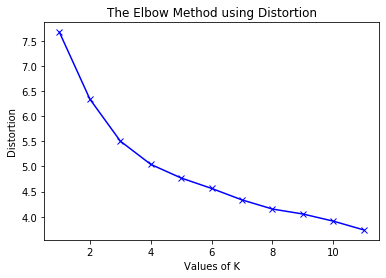

In [26]:
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
from sklearn.neighbors import LocalOutlierFactor

distortions = []
inertias = []
mapping1 = {}
mapping2 = {}
K = range(1, 12)
 
for k in K:
    # Building and fitting the model
    kmeanModel = KMeans(n_clusters=k).fit(adultData)
    kmeanModel.fit(adultData)
 
    distortions.append(sum(np.min(cdist(adultData, kmeanModel.cluster_centers_,
                                        'euclidean'), axis=1)) / adultData.shape[0])
    inertias.append(kmeanModel.inertia_)
 
    mapping1[k] = sum(np.min(cdist(adultData, kmeanModel.cluster_centers_,
                                   'euclidean'), axis=1)) / adultData.shape[0]
    mapping2[k] = kmeanModel.inertia_
    
    
for key, val in mapping1.items():
    print(f'{key} : {val}')

plt.plot(K, distortions, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Distortion')
plt.title('The Elbow Method using Distortion')
plt.show()

## Testing outlier removal with LOF (commenting out for now as outlier removal didnt improved so much)

model1 = LocalOutlierFactor(n_neighbors = 2, metric = "euclidean", contamination = 0.1)

y_pred = model1.fit_predict(adultData)

print('Removing ',len(y_pred[y_pred == -1]),' outlier samples')

adultData1       =  adultData[y_pred != -1].copy()
adultDatalabels1 =  adultDatalabels[y_pred != -1].copy()

In [27]:
adultDatalabels1 =  adultDatalabels.copy()
adultData1 =  adultData.copy()
kmeans4 = KMeans(n_clusters=2, random_state=0).fit(adultData1)

In [28]:
# Get Metrics of the resulting Clustering
#core_samples_mask = numpy.zeros_like(clustering_1_10_e.labels_, dtype=bool)
#core_samples_mask[clustering_1_10_e.core_sample_indices_] = True
labels = kmeans4.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)
print("Homogeneity: %0.3f" % metrics.homogeneity_score(adultDatalabels1, labels))
print("Confusion Matrix")
print( metrics.confusion_matrix(adultDatalabels1, labels)[0] ) 
print( metrics.confusion_matrix(adultDatalabels1, labels)[1] ) 
print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(adultData1, labels))
print("Overview over the Cluster")
silluets = metrics.silhouette_samples(adultData1, labels, metric='euclidean' )
i = 0
for l in set(labels):
    print(" ")
    num = list(labels).count(l)
    print("Cluster " + str(l) + " has Size: " + str( num ) )
    print("Silluete is: " + str( silluets[i] ))
    i = i+1

Estimated number of clusters: 2
Estimated number of noise points: 0
Homogeneity: 0.088
Confusion Matrix
[19235  5485]
[3324 4358]
Silhouette Coefficient: 0.317
Overview over the Cluster
 
Cluster 0 has Size: 22559
Silluete is: 0.4684339299818368
 
Cluster 1 has Size: 9843
Silluete is: 0.23183529922885748


### Visualize the clustering

In [85]:
adultData1 = adultData1.assign(label=labels)
adultData1 = adultData1.assign(true_label=adultDatalabels1)

In [86]:
df = adultData1.copy()
fig = px.scatter_3d(df, x='cap-gains', y='age', z='education_num',
              color='label', symbol='true_label')
fig.show()

In [91]:
fig = px.scatter_3d(df, x='hpw', y='age', z='education_num',
              color='true_label', symbol='label')
fig.show()

### Trying to find the optimal eps for the DBSCAN algorithm. 

Note: For the optimal k we take the optimal k we found in our knn algorithm in the previous project which is 15. 

In [60]:
neigh = NearestNeighbors(n_neighbors=15, p=2)
nbrs = neigh.fit(adultData)
distances, indices = nbrs.kneighbors(adultData)

In [61]:
distances = np.sort(distances, axis=0)
distances = distances[:,1]

Maximum point of curvature:  2.23606797749979


<Figure size 360x360 with 0 Axes>

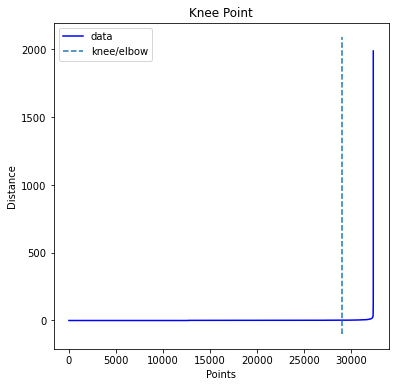

In [62]:
from kneed import KneeLocator

i = np.arange(len(distances))
knee = KneeLocator(i, distances, S=1, curve='convex', direction='increasing', interp_method='polynomial')

fig = plt.figure(figsize=(5, 5))
knee.plot_knee()
plt.xlabel("Points")
plt.ylabel("Distance")

print('Maximum point of curvature: ',distances[knee.knee])

In [63]:
np.median(distances)

1.0

In [64]:
np.mean(distances)

1.317573568827516

## Trying out Agglomerative clustering

In [77]:
from sklearn.cluster import AgglomerativeClustering

In [93]:
adultData1 = adultData.copy()
adultDatalabels1 = adultDatalabels.copy()

clustering = AgglomerativeClustering(n_clusters=2, linkage="ward")
Y_preds = clustering.fit_predict(adultData)

labels = Y_preds

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)
print("Homogeneity: %0.3f" % metrics.homogeneity_score(adultDatalabels1, labels))
print("Confusion Matrix")
print( metrics.confusion_matrix(adultDatalabels1, labels)[0] ) 
print( metrics.confusion_matrix(adultDatalabels1, labels)[1] ) 
print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(adultData1, labels))
print("Overview over the Cluster")
silluets = metrics.silhouette_samples(adultData1, labels, metric='euclidean' )
i = 0
for l in set(labels):
    print(" ")
    num = list(labels).count(l)
    print("Cluster " + str(l) + " has Size: " + str( num ) )
    print("Silluete is: " + str( silluets[i] ))
    i = i+1

Estimated number of clusters: 2
Estimated number of noise points: 0
Homogeneity: 0.075
Confusion Matrix
[19241  5479]
[3544 4138]
Silhouette Coefficient: 0.298
Overview over the Cluster
 
Cluster 0 has Size: 22785
Silluete is: 0.4934696968469314
 
Cluster 1 has Size: 9617
Silluete is: -0.22816651407801164


## Visualize the clustering results of the agglomerative clustering

In [94]:
adultData1 = adultData1.assign(label=Y_preds)
adultData1 = adultData1.assign(income=adultDatalabels1)

In [95]:
df = adultData1.copy()
fig = px.scatter_3d(df, x='cap-gains', y='age', z='education_num',
              color='label', symbol='income')
fig.show()

In [96]:
df = adultData1.copy()
fig = px.scatter_3d(df, x='age', y='income', z='education_num',
              color='label', symbol='income')
fig.show()